## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Camera calibration

In [1]:
import matplotlib as p
p.use('Qt4Agg')
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import pickle

%matplotlib inline
def calibration():
    nx = 9 
    ny = 6
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.
    img_sizes = []
    # Make a list of calibration images
    images = glob.glob('camera_cal/calibration*.jpg')
    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname)      
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)
        #print(fname,ret)
        # If found, add object points, image points
        if ret == True:
            # Use cv2.calibrateCamera() and cv2.undistort()
            objpoints.append(objp)
            imgpoints.append(corners)
            img_sizes.append([[img.shape[1], img.shape[0]]])
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    return mtx, dist

mtx, dist = calibration()
print("""""")
print("Camera matrix and distortion coefficient stored successful:")
print(mtx)
print(dist)
save_dict = {'mtx': mtx, 'dist': dist}
with open('calibrate_camera_matrix.p', 'wb') as f:
    pickle.dump(save_dict, f)
#num_of_pic = len(objpoints)



Camera matrix and distortion coefficient stored successful:
[[  1.15396093e+03   0.00000000e+00   6.69705359e+02]
 [  0.00000000e+00   1.14802495e+03   3.85656232e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
[[ -2.41017968e-01  -5.30720497e-02  -1.15810318e-03  -1.28318543e-04
    2.67124302e-02]]


## Distortion correction

D:\Anaconda\envs\carnd-term1\lib\site-packages\matplotlib\pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


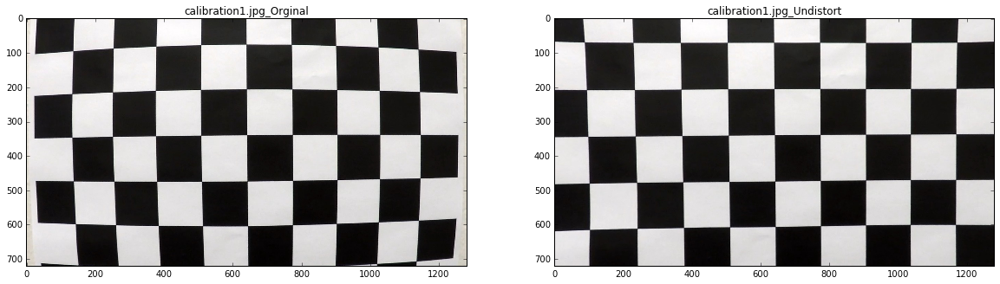

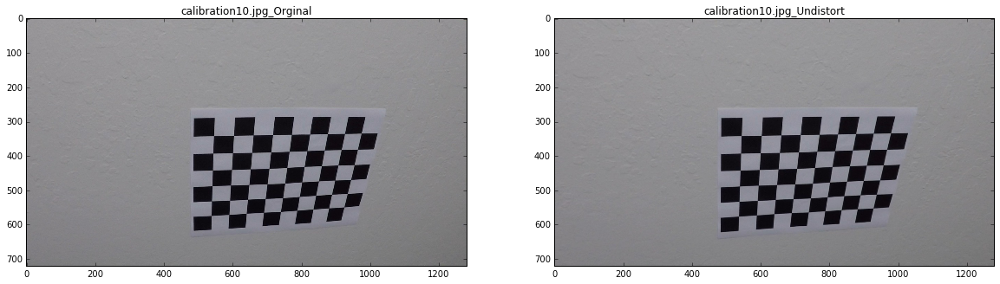

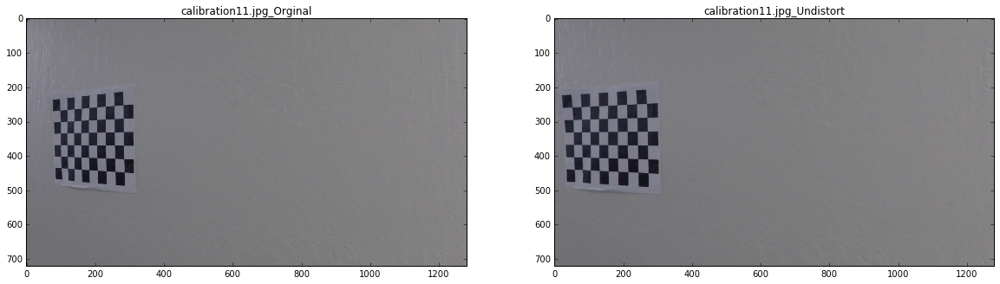

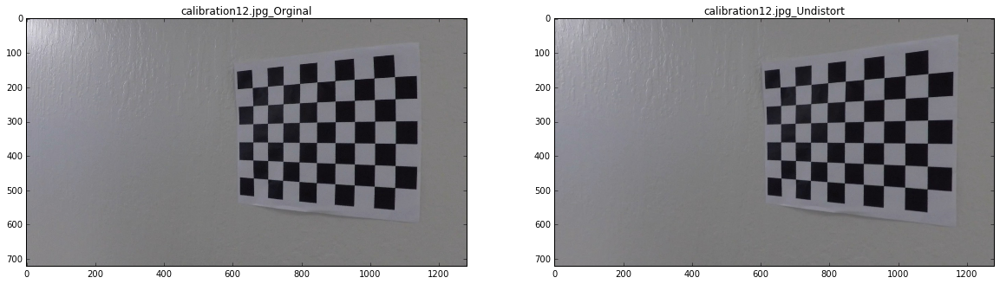

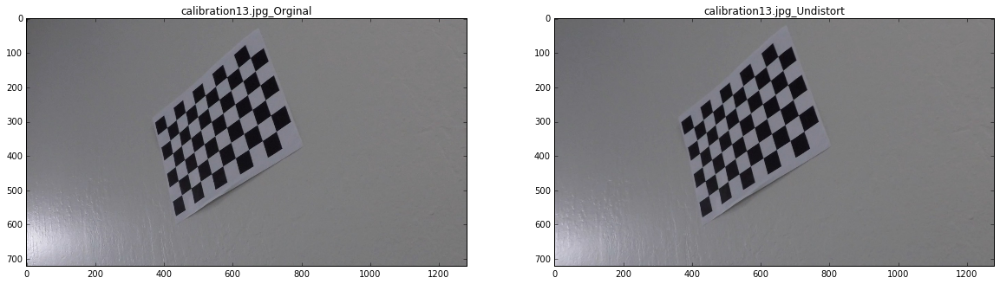

...

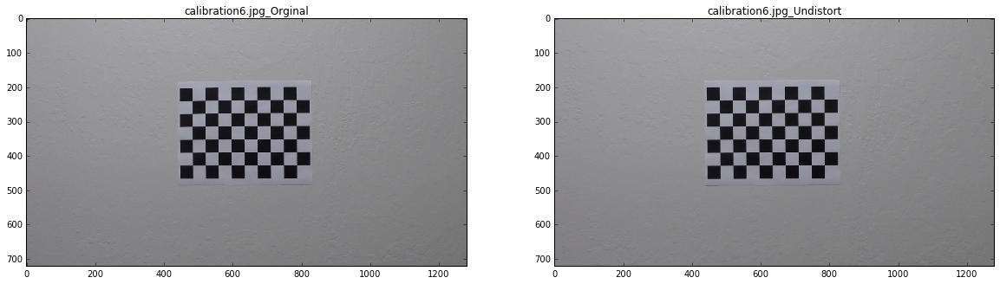

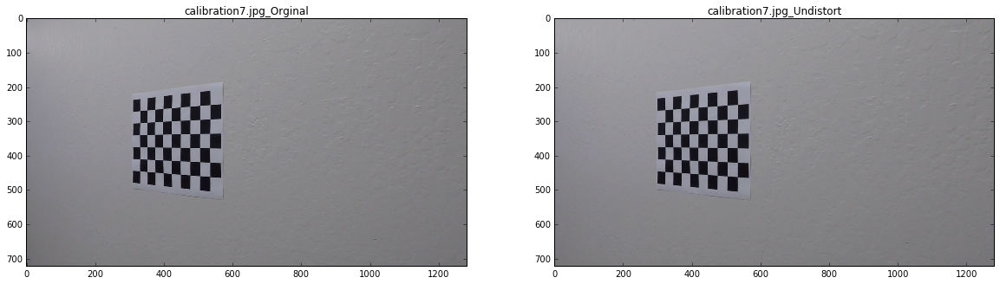

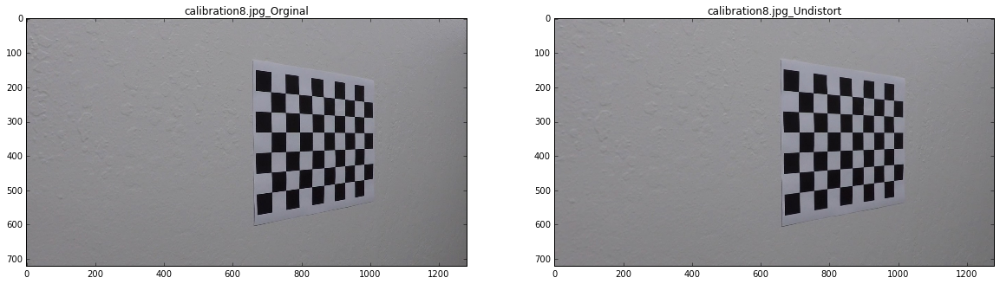

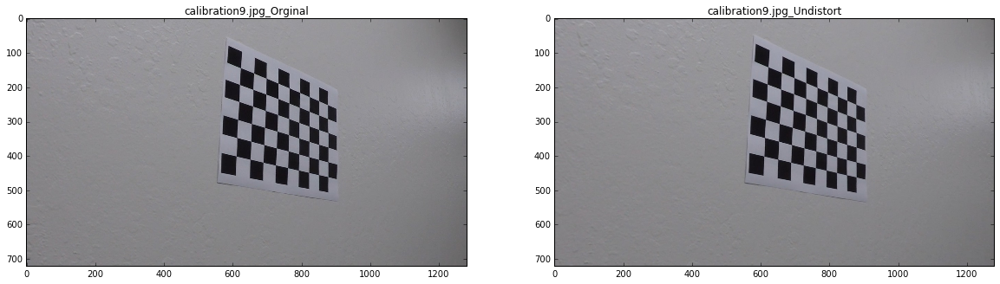

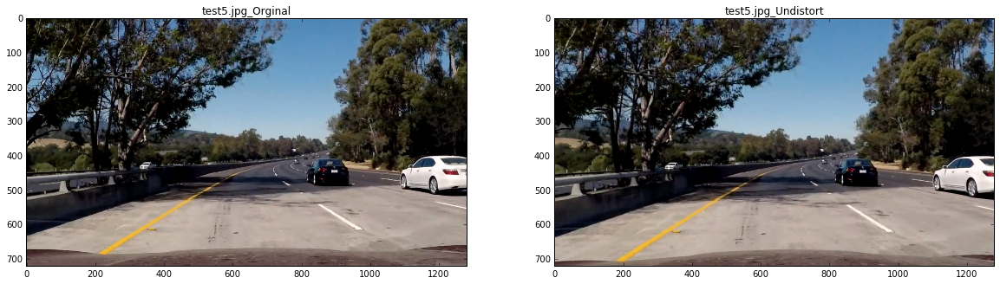

In [3]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import pickle
import cv2

%matplotlib inline
def cal_undistort(img, mtx, dist): 
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist
path = os.listdir("camera_cal/")

#images = glob.glob('camera_cal/calibration*.jpg')
# Step through the list and search for chessboard corners

with open('calibrate_camera_matrix.p', 'rb') as f:
    saved_dict = pickle.load(f)
mtx = saved_dict['mtx']
dist = saved_dict['dist']

i = 0
for item in path:
    i=i+1
    path_str = "camera_cal/"+str(item)
    img = mpimg.imread(path_str)
    undistort = cal_undistort(img, mtx, dist)
    fig = plt.figure(figsize=(20, 30))
    fig = plt.subplot(121)
    plt.imshow(img)
    plt.title(str(item) + "_Orginal")
    fig = plt.subplot(122)
    plt.imshow(undistort)
    plt.title(str(item) + "_Undistort")
    BGR = cv2.cvtColor(undistort, cv2.COLOR_RGB2BGR)
    cv2.imwrite("camera_cal/"+str(i) + "_undistort_"+str(item),BGR)


## Sobel Threshold

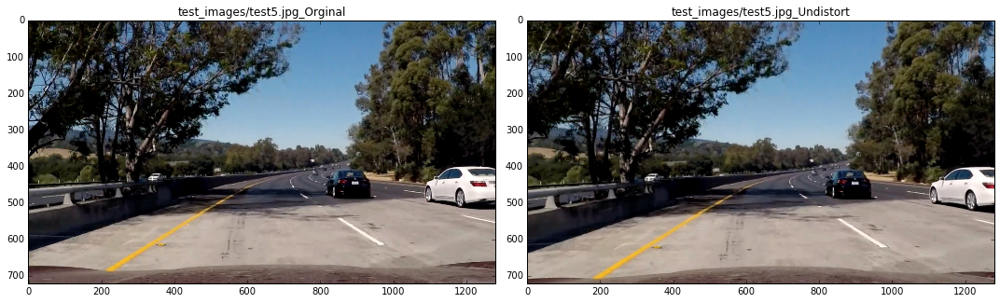

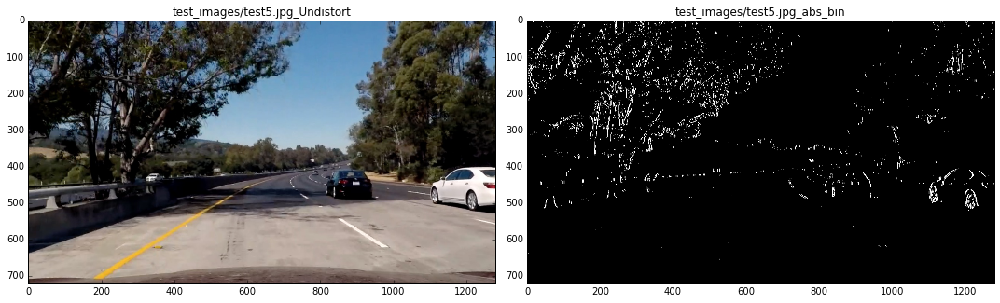

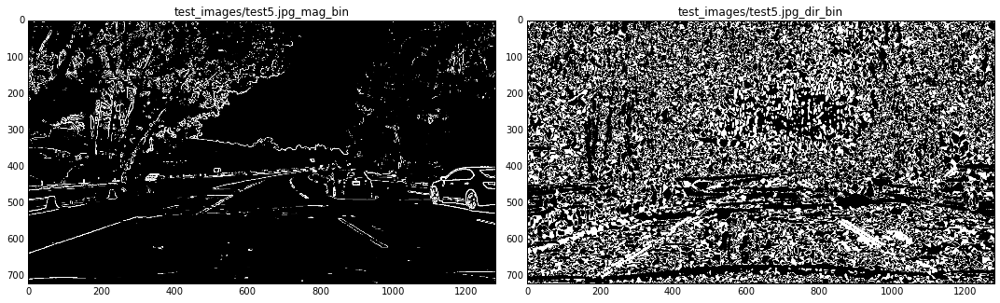

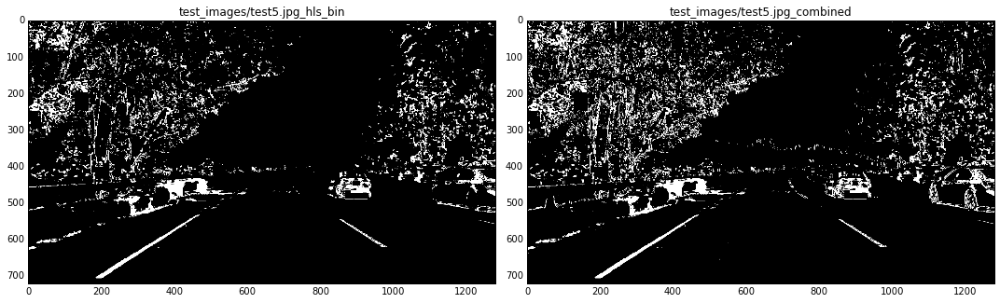

In [5]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import pickle
import cv2
%matplotlib inline

# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(30, 100)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def hls_thresh(img, thresh=(100, 250)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

def combined_thresh(img):
    abs_bin = abs_sobel_thresh(img, orient='x', thresh_min=50, thresh_max=255)
    mag_bin = mag_thresh(img, sobel_kernel=3, mag_thresh=(50, 255))
    dir_bin = dir_threshold(img, sobel_kernel=31, thresh=(0.7, 1.3))
    hls_bin = hls_thresh(img, thresh=(170, 255))
    combined = np.zeros_like(dir_bin)
    combined[(abs_bin == 1 | ((mag_bin == 1) & (dir_bin == 1))) | hls_bin == 1] = 1

    return combined, abs_bin, mag_bin, dir_bin, hls_bin 

# For example, here is a selection for pixels where both the x and y gradients meet the threshold criteria,
# or the gradient magnitude and direction are both within their threshold values.

test = 'test_images/test5.jpg'
with open('calibrate_camera_matrix.p', 'rb') as f:
    saved_dict = pickle.load(f)
mtx = saved_dict['mtx']
dist = saved_dict['dist']
img = mpimg.imread(test)
fig_1 = plt.figure(figsize=(15, 20))
fig_1 = plt.subplot(1, 2, 1)
plt.title(test + "_Orginal")
plt.imshow(img)
img = cv2.undistort(img, mtx, dist, None, mtx)
fig_1 = plt.subplot(1, 2, 2)
plt.title(test + "_Undistort")
plt.imshow(img) 
plt.tight_layout()

combined, abs_bin, mag_bin, dir_bin, hls_bin = combined_thresh(img)

fig_2 = plt.figure(figsize=(15, 20))
fig_2 = plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title(test + "_Undistort")

fig_2 = plt.subplot(1, 2, 2)
plt.imshow(abs_bin, cmap='gray', vmin=0, vmax=1)
plt.title(test + "_abs_bin")
plt.tight_layout()

fig_3 = plt.figure(figsize=(15, 20))
fig_3 = plt.subplot(1, 2, 1)
plt.imshow(mag_bin, cmap='gray', vmin=0, vmax=1)
plt.title(test + "_mag_bin")
fig_3 = plt.subplot(1, 2, 2)
plt.imshow(dir_bin, cmap='gray', vmin=0, vmax=1)
plt.title(test + "_dir_bin")
plt.tight_layout()

fig_4 = plt.figure(figsize=(15, 20))
fig_4 = plt.subplot(1, 2, 1)
plt.imshow(hls_bin, cmap='gray', vmin=0, vmax=1)
plt.title(test + "_hls_bin")
fig_4 = plt.subplot(1, 2, 2)
plt.imshow(combined, cmap='gray', vmin=0, vmax=1)
plt.title(test + "_combined")

plt.tight_layout()
#plt.show()


## Perspective Transform

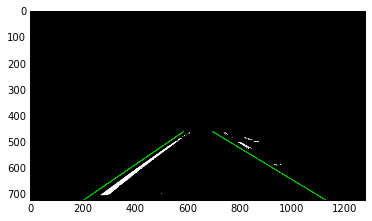

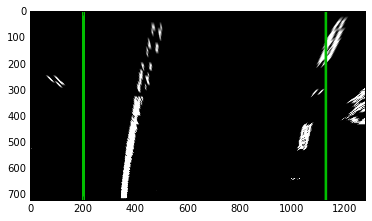

In [30]:
import cv2
import pickle
import matplotlib.image as mpimg

def perspective_transform(img):
    img_size = (img.shape[1], img.shape[0])
    src = np.float32(
    [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    
    dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])
    #src = np.float32(
        #[[200, 720],
         #[1100, 720],
         #[595, 450],
         #[685, 450]])
        
     #   [[210, 680],
      #   [1100, 680],
       #  [603, 440],
        # [677, 440]])
    #dst = np.float32(
        #[[300, 720],
         #[980, 720],
         #[300, 0],
         #[980, 0]])
        #[[433, 680],
         #[871, 680],
         #[433, 0],
         #[871, 0]])
     #   [[200, 680],
      #   [1100, 680],
       #  [200, 0],
        # [1100, 0]]) 
    # Grab the image shape
    

    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)

    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    unwarped = cv2.warpPerspective(warped, M_inv, (warped.shape[1], warped.shape[0]), flags=cv2.INTER_LINEAR)

    # Return the resulting image and matrix
    return warped, M , M_inv,unwarped
img_file = 'test_images/test6.jpg'
with open('calibrate_camera_matrix.p', 'rb') as f:
    save_dict = pickle.load(f)
mtx = save_dict['mtx']
dist = save_dict['dist']

#| Source        | Destination   | 
#|:-------------:|:-------------:| 
#| 585, 460      | 320, 0        | 
#| 203, 720      | 320, 720      |
#| 1127, 720     | 960, 720      |
#| 695, 460      | 960, 0        |

img = mpimg.imread(img_file)
img = cv2.undistort(img, mtx, dist, None, mtx)
undist = img
img, abs_bin, mag_bin, dir_bin, hls_bin = combined_thresh(img)

binary_warped, m, m_inv, unwarped = perspective_transform(img)
rgb_unwarped = unwarped.astype(np.float32)
rgb_unwarped = cv2.cvtColor(rgb_unwarped,cv2.COLOR_GRAY2BGR)
rgb_unwarped = cv2.line(rgb_unwarped, (203, 720), (585, 460), color = [255, 65, 0], thickness=3)
rgb_unwarped = cv2.line(rgb_unwarped, (1127, 720), (695, 460), color = [255, 65, 0], thickness=3)
plt.imshow(rgb_unwarped, cmap='gray', vmin=0, vmax=1)
plt.show()

rgb_warped = binary_warped.astype(np.float32)
rgb_warped = cv2.cvtColor(rgb_warped,cv2.COLOR_GRAY2BGR)
rgb_warped = cv2.line(rgb_warped, (203, 720), (203, 0), color = [255, 65, 0], thickness=10)
rgb_warped = cv2.line(rgb_warped, (1127, 720), (1127, 0), color = [255, 65, 0], thickness=10)
plt.imshow(rgb_warped)
plt.show()

## Lane Detection(Curve fitting)

640


(720, 0)

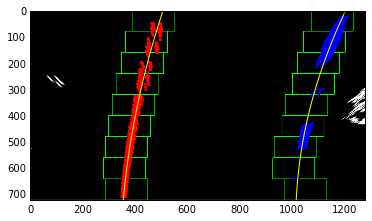

In [36]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
def line_fit(binary_warped):
	"""
	Find and fit lane lines
	"""
	# Assuming you have created a warped binary image called "binary_warped"
	# Take a histogram of the bottom half of the image
	histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
	# Create an output image to draw on and visualize the result
	out_img = (np.dstack((binary_warped, binary_warped, binary_warped))*255).astype('uint8')
	# Find the peak of the left and right halves of the histogram
	# These will be the starting point for the left and right lines
	midpoint = np.int(histogram.shape[0]/2)
	leftx_base = np.argmax(histogram[100:midpoint]) + 100
	rightx_base = np.argmax(histogram[midpoint:-100]) + midpoint

	# Choose the number of sliding windows
	nwindows = 9
	# Set height of windows
	window_height = np.int(binary_warped.shape[0]/nwindows)
	# Identify the x and y positions of all nonzero pixels in the image
	nonzero = binary_warped.nonzero()
	nonzeroy = np.array(nonzero[0])
	nonzerox = np.array(nonzero[1])
	# Current positions to be updated for each window
	leftx_current = leftx_base
	rightx_current = rightx_base
	# Set the width of the windows +/- margin
	margin = 100
	# Set minimum number of pixels found to recenter window
	minpix = 50
	# Create empty lists to receive left and right lane pixel indices
	left_lane_inds = []
	right_lane_inds = []

	# Step through the windows one by one
	for window in range(nwindows):
		# Identify window boundaries in x and y (and right and left)
		win_y_low = binary_warped.shape[0] - (window+1)*window_height
		win_y_high = binary_warped.shape[0] - window*window_height
		win_xleft_low = leftx_current - margin
		win_xleft_high = leftx_current + margin
		win_xright_low = rightx_current - margin
		win_xright_high = rightx_current + margin
		# Draw the windows on the visualization image
		cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2)
		cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
		# Identify the nonzero pixels in x and y within the window
		good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
		good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
		# Append these indices to the lists
		left_lane_inds.append(good_left_inds)
		right_lane_inds.append(good_right_inds)
		# If you found > minpix pixels, recenter next window on their mean position
		if len(good_left_inds) > minpix:
			leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
		if len(good_right_inds) > minpix:
			rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

	# Concatenate the arrays of indices
	left_lane_inds = np.concatenate(left_lane_inds)
	right_lane_inds = np.concatenate(right_lane_inds)

	# Extract left and right line pixel positions
	leftx = nonzerox[left_lane_inds]
	lefty = nonzeroy[left_lane_inds]
	rightx = nonzerox[right_lane_inds]
	righty = nonzeroy[right_lane_inds]

	# Fit a second order polynomial to each
	left_fit = np.polyfit(lefty, leftx, 2)
	right_fit = np.polyfit(righty, rightx, 2)

	# Return a dict of relevant variables
	ret = {}
	ret['left_fit'] = left_fit
	ret['right_fit'] = right_fit
	ret['nonzerox'] = nonzerox
	ret['nonzeroy'] = nonzeroy
	ret['out_img'] = out_img
	ret['left_lane_inds'] = left_lane_inds
	ret['right_lane_inds'] = right_lane_inds

	return ret
def tune_fit(binary_warped, left_fit, right_fit):
	"""
	Given a previously fit line, quickly try to find the line based on previous lines
	"""
	# Assume you now have a new warped binary image
	# from the next frame of video (also called "binary_warped")
	# It's now much easier to find line pixels!
	nonzero = binary_warped.nonzero()
	nonzeroy = np.array(nonzero[0])
	nonzerox = np.array(nonzero[1])
	margin = 100
	left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin)))
	right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))

	# Again, extract left and right line pixel positions
	leftx = nonzerox[left_lane_inds]
	lefty = nonzeroy[left_lane_inds]
	rightx = nonzerox[right_lane_inds]
	righty = nonzeroy[right_lane_inds]

	# If we don't find enough relevant points, return all None (this means error)
	min_inds = 10
	if lefty.shape[0] < min_inds or righty.shape[0] < min_inds:
		return None

	# Fit a second order polynomial to each
	left_fit = np.polyfit(lefty, leftx, 2)
	right_fit = np.polyfit(righty, rightx, 2)
	# Generate x and y values for plotting
	ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
	left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
	right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

	# Return a dict of relevant variables
	ret = {}
	ret['left_fit'] = left_fit
	ret['right_fit'] = right_fit
	ret['nonzerox'] = nonzerox
	ret['nonzeroy'] = nonzeroy
	ret['left_lane_inds'] = left_lane_inds
	ret['right_lane_inds'] = right_lane_inds

	return ret

# Assuming you have created a warped binary image called "binary_warped"
# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = (np.dstack((binary_warped, binary_warped, binary_warped))*255).astype('uint8')
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
print(midpoint)
leftx_base = np.argmax(histogram[:midpoint]) + 0#100
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 80
# Set minimum number of pixels found to recenter window
minpix = 10
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window + 1) * window_height
    win_y_high = binary_warped.shape[0] - window * window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)


## Curvature Radius

3060.65977269 1698.3920232
1113.52996696 623.292747461


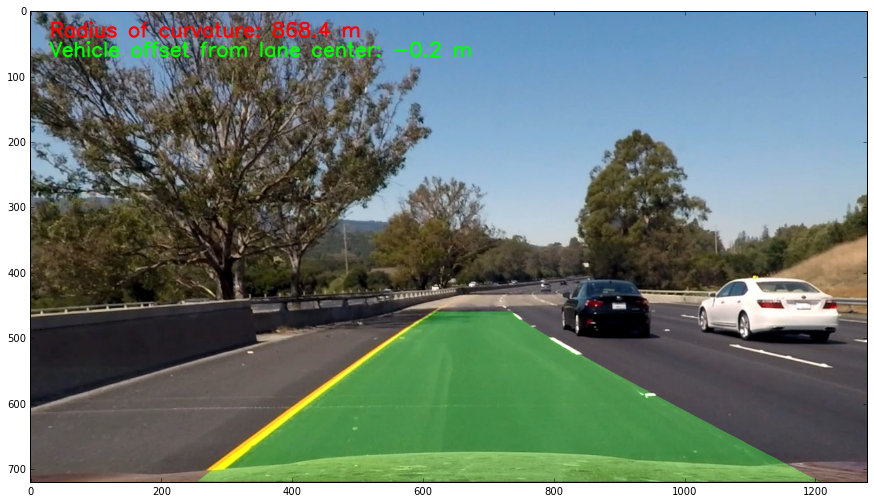

In [37]:
def radius(left_fit,right_fit):
# Define y-value where we want radius of curvature
# I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = 719
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    return print(left_curverad, right_curverad)
# Example values: 1926.74 1908.48

def radius_m(left_lane_inds, right_lane_inds, nonzerox, nonzeroy):

    y_eval = 719  # 720p video/image, so last (lowest on screen) y index is 719

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/680 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters

    return left_curverad, right_curverad


def calc_vehicle_offset(undist, left_fit, right_fit):
# Calculate vehicle center offset in pixels
    bottom_y = undist.shape[0] - 1
    bottom_x_left = left_fit[0]*(bottom_y**2) + left_fit[1]*bottom_y + left_fit[2]
    bottom_x_right = right_fit[0]*(bottom_y**2) + right_fit[1]*bottom_y + right_fit[2]
    vehicle_offset = undist.shape[1]/2 - (bottom_x_left + bottom_x_right)/2

# Convert pixel offset to meters
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    vehicle_offset *= xm_per_pix

    return vehicle_offset


def final_viz(undist, left_fit, right_fit, m_inv, left_curve, right_curve, vehicle_offset):
    """
    Final lane line prediction visualized and overlayed on top of original image
    """
    # Generate x and y values for plotting
    ploty = np.linspace(0, undist.shape[0]-1, undist.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image to draw the lines on
    #warp_zero = np.zeros_like(warped).astype(np.uint8)
    #color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    color_warp = np.zeros((720, 1280, 3), dtype='uint8')  # NOTE: Hard-coded image dimensions

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, m_inv, (undist.shape[1], undist.shape[0]))
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)

    # Annotate lane curvature values and vehicle offset from center
    avg_curve = (left_curve + right_curve)/2
    label_str = 'Radius of curvature: %.1f m' % avg_curve
    result = cv2.putText(result, label_str, (30,40), 0, 1, (255,0,0), 2, cv2.LINE_AA)

    label_str = 'Vehicle offset from lane center: %.1f m' % vehicle_offset
    result = cv2.putText(result, label_str, (30,70), 0, 1, (0,255,0), 2, cv2.LINE_AA)

    return result

radius(left_fit,right_fit)
left_curve,right_curve = radius_m(left_lane_inds, right_lane_inds, nonzerox, nonzeroy)
print(left_curve, right_curve)
vehicle_offset = calc_vehicle_offset(undist, left_fit, right_fit)
output = final_viz(undist, left_fit, right_fit, m_inv, left_curve, right_curve, vehicle_offset)
fig_live = plt.figure(figsize=(15, 20))
plt.imshow(output)

## Pipeline Live processing

In [31]:
from moviepy.editor import VideoFileClip
class Line():
    def __init__(self, n):

        self.n = n
        self.detected = False

        # Polynomial coefficients: x = A*y^2 + B*y + C
        # Each of A, B, C is a "list-queue" with max length n
        self.A = []
        self.B = []
        self.C = []
        # Average of above
        self.A_avg = 0.
        self.B_avg = 0.
        self.C_avg = 0.

    def get_fit(self):
        return (self.A_avg, self.B_avg, self.C_avg)

    def add_fit(self, fit_coeffs):
        # Coefficient queue full?
        q_full = len(self.A) >= self.n
        # Append line fit coefficients
        self.A.append(fit_coeffs[0])
        self.B.append(fit_coeffs[1])
        self.C.append(fit_coeffs[2])

        # Pop from index 0 if full
        if q_full:
            _ = self.A.pop(0)
            _ = self.B.pop(0)
            _ = self.C.pop(0)
        # Simple average of line coefficients
        self.A_avg = np.mean(self.A)
        self.B_avg = np.mean(self.B)
        self.C_avg = np.mean(self.C)

        return (self.A_avg, self.B_avg, self.C_avg)

with open('calibrate_camera_matrix.p', 'rb') as f:
    save_dict = pickle.load(f)
mtx = save_dict['mtx']
dist = save_dict['dist']
window_size = 5  
# how many frames for line smoothing
left_line = Line(n=window_size)
right_line = Line(n=window_size)
detected = False  
# did the fast line fit detect the lines?
left_curve, right_curve = 0., 0.  
# radius of curvature for left and right lanes
left_lane_inds, right_lane_inds = None, None  
# for calculating curvature

def annotate_image(img_in):
    """
    Annotate the input image with lane line markings
    Returns annotated image
    """
    global mtx, dist, left_line, right_line, detected
    global left_curve, right_curve, left_lane_inds, right_lane_inds
    
    # Undistort, threshold, perspective transform
    undist = cal_undistort(img_in, mtx, dist)
    img, abs_bin, mag_bin, dir_bin, hls_bin = combined_thresh(undist)
    binary_warped, m, m_inv, binary_unwarped = perspective_transform(img)

    # Perform polynomial fit
    if not detected:
        # Slow line fit
        ret = line_fit(binary_warped)
        left_fit = ret['left_fit']
        right_fit = ret['right_fit']
        nonzerox = ret['nonzerox']
        nonzeroy = ret['nonzeroy']
        left_lane_inds = ret['left_lane_inds']
        right_lane_inds = ret['right_lane_inds']

        # Get moving average of line fit coefficients
        left_fit = left_line.add_fit(left_fit)
        right_fit = right_line.add_fit(right_fit)

        # Calculate curvature
        left_curve, right_curve = radius_m(left_lane_inds, right_lane_inds, nonzerox, nonzeroy)

        detected = True  # slow line fit always detects the line

    else:  # implies detected == True
        # Fast line fit
        left_fit = left_line.get_fit()
        right_fit = right_line.get_fit()
        ret = tune_fit(binary_warped, left_fit, right_fit)
        left_fit = ret['left_fit']
        right_fit = ret['right_fit']
        nonzerox = ret['nonzerox']
        nonzeroy = ret['nonzeroy']
        left_lane_inds = ret['left_lane_inds']
        right_lane_inds = ret['right_lane_inds']

        # Only make updates if we detected lines in current frame
        if ret is not None:
            left_fit = ret['left_fit']
            right_fit = ret['right_fit']
            nonzerox = ret['nonzerox']
            nonzeroy = ret['nonzeroy']
            left_lane_inds = ret['left_lane_inds']
            right_lane_inds = ret['right_lane_inds']

            left_fit = left_line.add_fit(left_fit)
            right_fit = right_line.add_fit(right_fit)
            left_curve, right_curve = radius_m(left_lane_inds, right_lane_inds, nonzerox, nonzeroy)
        else:
            detected = False

    vehicle_offset = calc_vehicle_offset(undist, left_fit, right_fit)

    # Perform final visualization on top of original undistorted image
    result = final_viz(undist, left_fit, right_fit, m_inv, left_curve, right_curve, vehicle_offset)

    return result
def annotate_video(input_file, output_file):
    """ Given input_file video, save annotated video to output_file """
    #video = VideoFileClip(input_file).subclip(0,1)
    video = VideoFileClip(input_file)
    annotated_video = video.fl_image(annotate_image)
    %time annotated_video.write_videofile(output_file, audio=False)

challenge_output = 'project_video.mp4'
annotate_video(challenge_output,'out.mp4')

[MoviePy] >>>> Building video out.mp4
[MoviePy] Writing video out.mp4



 13%|█▎        | 161/1261 [00:49<05:32,  3.31it/s]


 25%|██▌       | 321/1261 [01:38<04:41,  3.34it/s]


 38%|███▊      | 481/1261 [02:26<04:08,  3.14it/s]


 51%|█████     | 641/1261 [03:15<03:15,  3.18it/s]


 64%|██████▎   | 801/1261 [04:03<02:14,  3.43it/s]


 76%|███████▌  | 961/1261 [04:51<01:28,  3.38it/s]


 89%|████████▊ | 1119/1261 [05:38<00:42,  3.33it/s]


100%|█████████▉| 1260/1261 [06:20<00:00,  3.34it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: out.mp4 

Wall time: 6min 21s


In [34]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
project_video = './output_images/out.mp4'
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_video))